# **Shahzeb Faisal 21L-5649**
# **Haris Amjad 21L-5672**

# **Visual Description Generator for Images**

**Import required libraries**

In [1]:
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'  # Suppress TensorFlow warnings

import keras
import matplotlib.pyplot as plt
import tensorflow as tf
import sys, time, warnings
import numpy as np
import pandas as pd
from collections import Counter

warnings.filterwarnings("ignore")

print("python {}".format(sys.version))
print("keras version {}".format(keras.__version__))
print("tensorflow version {}".format(tf.__version__))


python 3.10.13 | packaged by conda-forge | (main, Dec 23 2023, 15:36:39) [GCC 12.3.0]
keras version 3.2.1
tensorflow version 2.15.0


In [2]:
!pip install rarfile

ERROR: Could not find a version that satisfies the requirement rarfile (from versions: none)
ERROR: No matching distribution found for rarfile


**Setting GPU memory fraction and device visibility**

In [3]:
import tensorflow as tf
import numpy as np
import random

physical_devices = tf.config.experimental.list_physical_devices('GPU')
if physical_devices:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
    tf.config.experimental.set_visible_devices(physical_devices[0], 'GPU')

def set_seed(sd=144):
    # numpy random seed
    np.random.seed(sd)

    # core python's random number
    random.seed(sd)

    # tensorflow's random number
    tf.random.set_seed(sd)


**Mout My Drive**

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Import ImageDS dataset and its captions

In [7]:
#import rarfile
import os


# Path to your rar file
#rar_file_path = "/content/drive/MyDrive/ImagesDS.rar"

#rar_ref = rarfile.RarFile(rar_file_path, 'r')
# Extract the contents of the rar file
#rar_ref.extractall("Data/ImagesDS_Dataset/")  # Extract to the same directory as the original directory
#rar_ref.close()

# Use the extracted directory
dir_ImagesDS_jpg = "/kaggle/input/imageds/Images"
#dir_ImagesDS_jpg = "Data/ImagesDS_Dataset/"
jpgs = os.listdir(dir_ImagesDS_jpg)
print("The number of files in ImagesDS: {}".format(len(jpgs)))


The number of files in ImagesDS: 8091


In [8]:
import pandas as pd
from collections import Counter

# Define the path
captions_file_path = "/kaggle/input/imageds/captions.txt"

# Read the captions file
df_txt = pd.read_csv(captions_file_path)
print(df_txt.head())

# Count the number of unique filenames and display some information
uni_filenames = df_txt['image'].unique()
print("The number of unique file names: {}".format(len(uni_filenames)))
print("The distribution of the number of captions for each image:")
print(Counter(df_txt['image'].value_counts().values))

                       image  \
0  1000268201_693b08cb0e.jpg   
1  1000268201_693b08cb0e.jpg   
2  1000268201_693b08cb0e.jpg   
3  1000268201_693b08cb0e.jpg   
4  1000268201_693b08cb0e.jpg   

                                             caption  
0  A child in a pink dress is climbing up a set o...  
1              A girl going into a wooden building .  
2   A little girl climbing into a wooden playhouse .  
3  A little girl climbing the stairs to her playh...  
4  A little girl in a pink dress going into a woo...  
The number of unique file names: 8091
The distribution of the number of captions for each image:
Counter({5: 8091})


**Display images and their captions from the dataset**

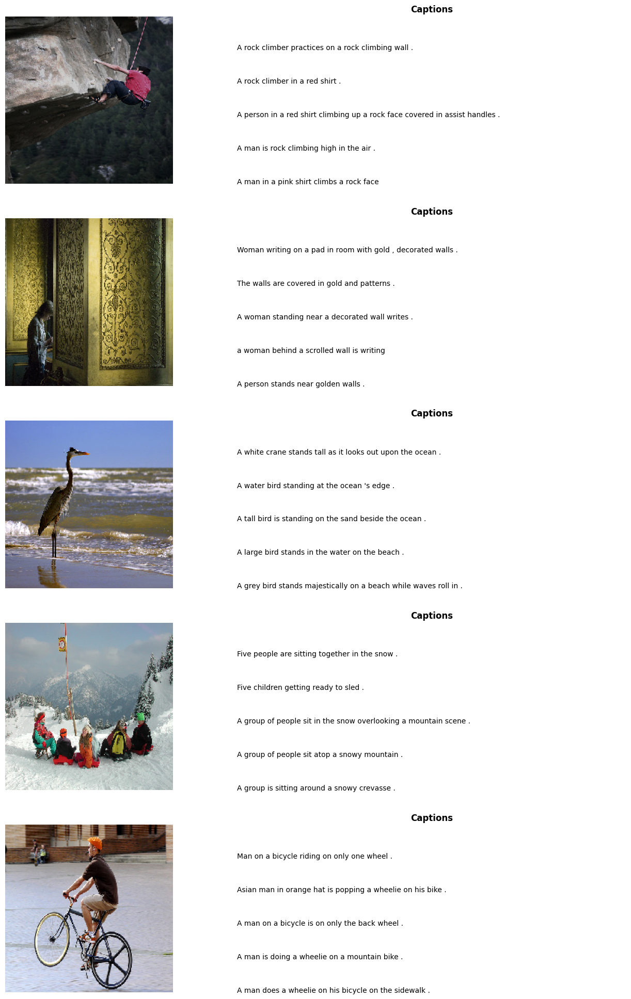

In [9]:
import matplotlib.pyplot as plt
from keras.preprocessing.image import load_img

npic = 5  # Displaying 5 images from the dataset
npix = 224
target_size = (npix, npix)

fig, axes = plt.subplots(npic, 2, figsize=(15, 20))

for idx, jpgfnm in enumerate(uni_filenames[::-1][:5]):
    filename = f"/kaggle/input/imageds/Images/{jpgfnm}"
    captions = list(df_txt.loc[df_txt["image"] == jpgfnm, "caption"].values)
    image_load = load_img(filename, target_size=target_size)

    axes[idx, 0].imshow(image_load)
    axes[idx, 0].axis('off')

    axes[idx, 1].set_xlim(0, 1)
    axes[idx, 1].set_ylim(0, len(captions))
    axes[idx, 1].axis('off')
    axes[idx, 1].set_title('Captions', fontsize=12, fontweight='bold')
    axes[idx, 1].tick_params(axis='both', which='both', length=0)
    for i, caption in enumerate(captions):
        axes[idx, 1].text(0, i, caption, fontsize=10, wrap=True)

plt.tight_layout(pad=3.0)
plt.show()


**Cleaning Captions for further Analysis and Processing**

In [10]:
import pandas as pd
import string
from collections import Counter

# Function to calculate the top 5 words in all the captions available for the images
def df_word(df_txt):
    vocabulary = []
    for txt in df_txt.caption.values:
        vocabulary.extend(txt.split())
    print('Vocabulary Size: %d' % len(set(vocabulary)))
    ct = Counter(vocabulary)
    dfword = pd.DataFrame({"word":list(ct.keys()),"count":list(ct.values())})
    dfword = dfword.sort_values("count",ascending=False)
    dfword = dfword.reset_index()[["word","count"]]
    return(dfword)

# Function to remove punctuation
def remove_punctuation(text_original):
    text_no_punctuation = text_original.translate(str.maketrans('','',string.punctuation))
    return(text_no_punctuation)

# Function to remove single character
def remove_single_character(text):
    text_len_more_than1 = ""
    for word in text.split():
        if len(word) > 1:
            text_len_more_than1 += " " + word
    return(text_len_more_than1)

# Function to remove numeric
def remove_numeric(text, printTF=False):
    text_no_numeric = ""
    for word in text.split():
        isalpha = word.isalpha()
        if printTF:
            print("    {:10} : {:}".format(word,isalpha))
        if isalpha:
            text_no_numeric += " " + word
    return(text_no_numeric)

# Combination of all functions
def text_clean(text_original):
    text = remove_punctuation(text_original)
    text = remove_single_character(text)
    text = remove_numeric(text)
    return(text)

In [11]:
#Show the Result
dfword = df_word(df_txt)
dfword.head(5)

Vocabulary Size: 9630


,word,count
0,a,40319
1,.,36577
2,A,22667
3,in,18962
4,the,15328


In [12]:
# Try on Example
text_original = "The price of the new iPhone is $999. Python 3.9 was released last month. 2023 was a great year!"
print(text_original)

print("\nRemove punctuations..")
text_no_punctuation = remove_punctuation(text_original)
print(text_no_punctuation)

print("\nRemove a single character word..")
text_len_more_than1 = remove_single_character(text_no_punctuation)
print(text_len_more_than1)

print("\nRemove words with numeric values..")
text_no_numeric = remove_numeric(text_len_more_than1,printTF=True)
print(text_no_numeric)

# Now try on Captions
for i, caption in enumerate(df_txt.caption.values):
    newcaption = text_clean(caption)
    df_txt["caption"].iloc[i] = newcaption

The price of the new iPhone is $999. Python 3.9 was released last month. 2023 was a great year!

Remove punctuations..
The price of the new iPhone is 999 Python 39 was released last month 2023 was a great year

Remove a single character word..
 The price of the new iPhone is 999 Python 39 was released last month 2023 was great year

Remove words with numeric values..
    The        : True
    price      : True
    of         : True
    the        : True
    new        : True
    iPhone     : True
    is         : True
    999        : False
    Python     : True
    39         : False
    was        : True
    released   : True
    last       : True
    month      : True
    2023       : False
    was        : True
    great      : True
    year       : True
 The price of the new iPhone is Python was released last month was great year


**Visualize top 40 words in the cleaned dataset**

Vocabulary Size: 9473


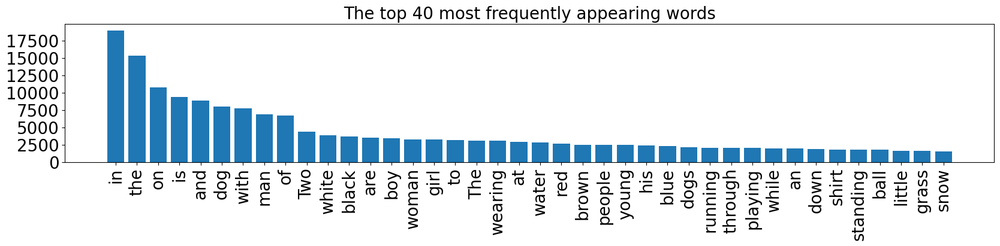

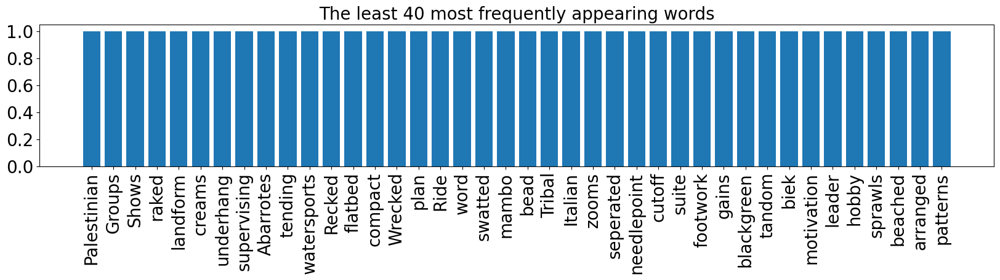

In [13]:
import matplotlib.pyplot as plt

# Function for Graph to show top 40 most frequently appearing words
def plthist(dfsub, title="The top 40 most frequently appearing words"):
    plt.figure(figsize=(20, 3))
    plt.bar(dfsub.index, dfsub["count"])
    plt.xticks(dfsub.index, dfsub["word"], rotation=90, fontsize=20)
    plt.yticks(fontsize=20)
    plt.title(title, fontsize=20)
    plt.show()

# Number of Words
topn = 40

dfword = df_word(df_txt)

plthist(dfword.iloc[:topn, :], title="The top 40 most frequently appearing words")
plthist(dfword.iloc[-topn:, :], title="The least 40 most frequently appearing words")


**Adding start and end sequence tokens for each captions**

In [14]:
# Function to add start and end sequence tokens
def add_start_end_seq_token(captions):
    caps = []
    for txt in captions:
        txt = 'startseq ' + txt + ' endseq'
        caps.append(txt)
    return caps

df_txt0 = df_txt.assign(caption=add_start_end_seq_token(df_txt["caption"]))
df_txt0.head(5)

,image,caption
0,1000268201_693b08cb0e.jpg,startseq child in pink dress is climbing up s...
1,1000268201_693b08cb0e.jpg,startseq girl going into wooden building endseq
2,1000268201_693b08cb0e.jpg,startseq little girl climbing into wooden pla...
3,1000268201_693b08cb0e.jpg,startseq little girl climbing the stairs to h...
4,1000268201_693b08cb0e.jpg,startseq little girl in pink dress going into...


**Load VGG16 model and weights to extract features from the images and Delete the last layer of the model**

In [15]:
from keras.applications import VGG16
from keras.models import Model

# Define the path to the downloaded VGG16 weights file
weights_path = "/kaggle/input/weigths/vgg16_weights_tf_dim_ordering_tf_kernels.h5"

# Load VGG16 with the downloaded weights file
model_vgg = VGG16(include_top=True, weights=None)  # Set weights to None to avoid downloading
model_vgg.load_weights(weights_path)

# Removing the last layer for feature extraction
model_vgg.layers.pop()
model_vgg = Model(inputs=model_vgg.inputs, outputs=model_vgg.layers[-1].output)

# Show the results
model_vgg.summary()


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc1 (Dense)                     │ (None, 4096)           │   102,764,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc2 (Dense)                     │ (None, 4096)           │    16,781,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ predictions (Dense)             │ (None, 1000)           │     4,097,000 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 138,357,544 (527.79 MB)

 Trainable params: 138,357,544 (527.79 MB)

 Non-trainable params: 0 (0.00 B)

# **Feature Extraction**


**Plotting similar images from the dataset**


We first create clusters to identify which images belong together. PCA is used to reduce the dimensionality of the features obtained from VGG-16 feature extraction from 4096 to 2. The clusters are then plotted, and a few examples are selected from each cluster for display

In [17]:
from collections import OrderedDict
from keras.preprocessing.image import load_img, img_to_array
from keras.applications.vgg16 import preprocess_input
import os
import numpy as np

npix = 224  # Image size is fixed at 224 because VGG16 model has been pre-trained to take that size.
target_size = (npix, npix)
image_dir = "/kaggle/input/imageds/Images"

# Initialize data structures
images = OrderedDict()
batch_size = 100  # Define the batch size, adjust based on your GPU memory

# Function to process and predict in batches
def process_images_in_batches(filenames):
    batch_images = []
    batch_filenames = []

    for filename in filenames:
        if filename.endswith('.jpg'):
            filepath = os.path.join(image_dir, filename)
            image = load_img(filepath, target_size=target_size)
            image = img_to_array(image)
            image = preprocess_input(image)

            # Append to batch
            batch_images.append(image)
            batch_filenames.append(filename)

            # Check if the batch is full
            if len(batch_images) == batch_size:
                batch_tensor = np.array(batch_images)
                y_pred = model_vgg.predict(batch_tensor)
                for name, pred in zip(batch_filenames, y_pred):
                    images[name] = pred.flatten()
                # Clear the batch to make room for the next batch
                batch_images = []
                batch_filenames = []

    # Process the last batch if it has less than batch_size images
    if batch_images:
        batch_tensor = np.array(batch_images)
        y_pred = model_vgg.predict(batch_tensor)
        for name, pred in zip(batch_filenames, y_pred):
            images[name] = pred.flatten()

# Gather all jpg filenames
jpg_filenames = [name for name in os.listdir(image_dir) if name.endswith('.jpg')]

# Process images in batches
process_images_in_batches(jpg_filenames)


4/4 ━━━━━━━━━━━━━━━━━━━━ 26s 6s/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 25s 6s/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 26s 6s/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 25s 6s/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 25s 6s/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 26s 6s/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 26s 6s/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 25s 6s/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 25s 6s/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 25s 6s/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 25s 6s/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 25s 6s/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 25s 6s/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 26s 6s/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 26s 6s/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 26s 6s/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 26s 6s/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 25s 6s/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 25s 6s/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 25s 6s/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 25s 6s/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 25s 6s/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 25s 6s/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 25s 6s/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 25s 6s/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 25s 6s/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 25s 6s/step
4

[[1.28209763e-07 2.09005790e-07 1.43358886e-06 ... 1.55670409e-06
  6.77509490e-07 3.50165756e-05]
 [3.04435410e-09 3.67493858e-09 5.31091366e-08 ... 1.92593674e-09
  7.98370024e-07 2.71897011e-06]
 [5.65246701e-05 1.11272425e-06 1.25723977e-06 ... 8.25386178e-06
  2.20957700e-05 3.71019705e-05]
 ...
 [7.91256184e-07 4.28207159e-07 4.66999694e-07 ... 1.84512970e-07
  3.67031862e-05 5.94524681e-06]
 [1.06202633e-05 1.48458585e-05 1.52985322e-05 ... 1.26668281e-04
  2.48958713e-05 5.62815767e-05]
 [1.67130365e-09 9.03561614e-10 1.56833924e-08 ... 2.28096379e-11
  3.43664084e-08 6.85393331e-07]]
PCA(n_components=2)


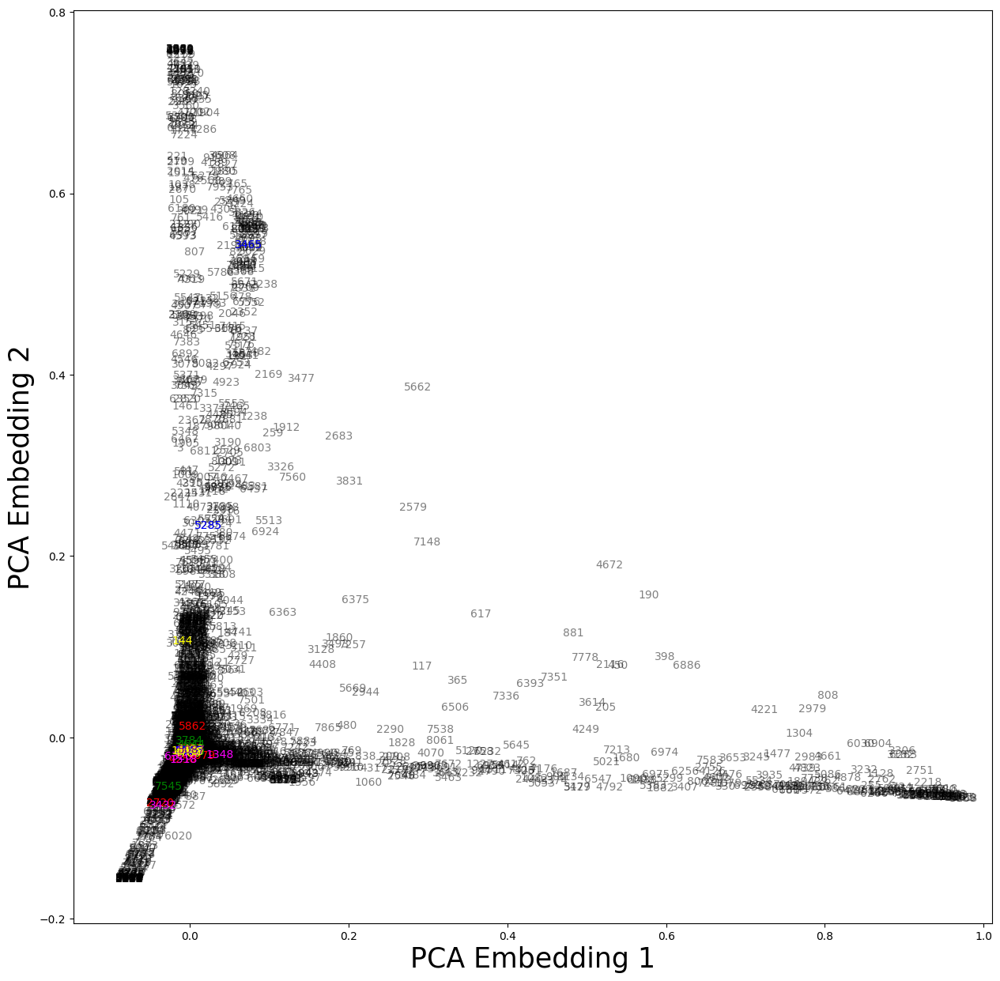

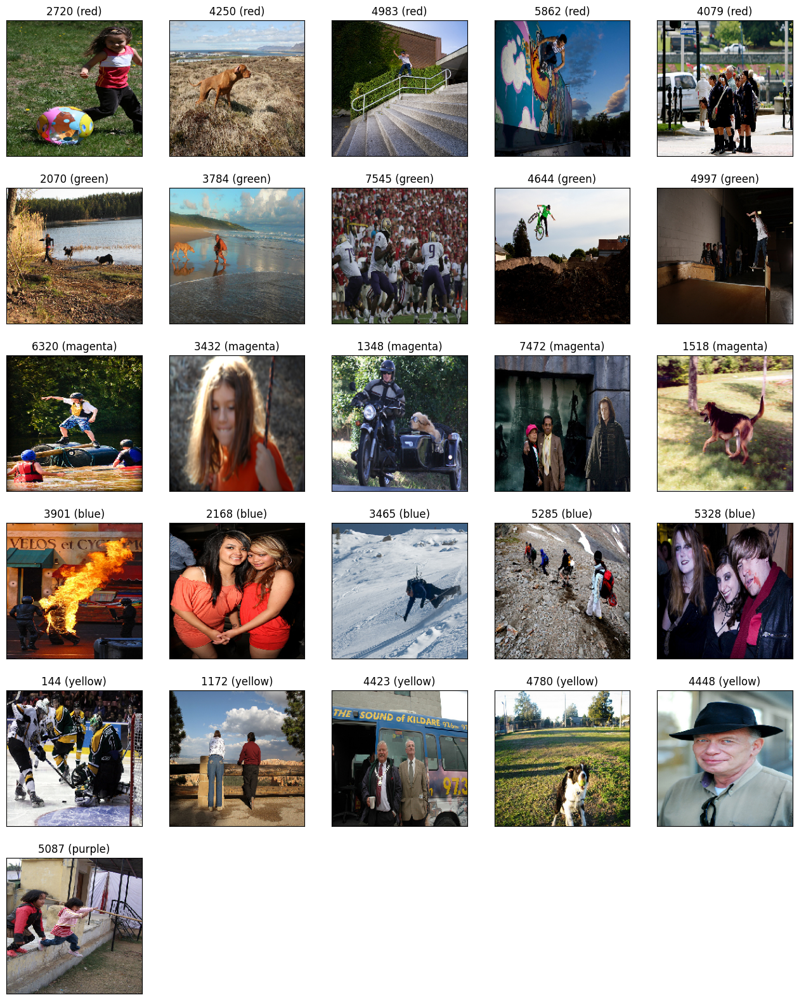

In [18]:
import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import os
from collections import OrderedDict

# Convert the dictionary values (image predictions) into a numpy array
encoder = np.array(list(images.values()))

# Perform PCA with 2 components
pca = PCA(n_components=2)
y_pca = pca.fit_transform(encoder)

# Print the encoded images and PCA details
print(encoder)
print(pca)

# Define selected pictures creating clusters
picked_pic = OrderedDict()
picked_pic["red"]     = [2720, 4250, 4983, 5862, 4079]
picked_pic["green"]   = [2070, 3784, 7545, 4644, 4997]
picked_pic["magenta"] = [6320, 3432, 1348, 7472, 1518]
picked_pic["blue"]    = [3901, 2168, 3465, 5285, 5328]
picked_pic["yellow"]  = [144, 1172, 4423, 4780, 4448]
picked_pic["purple"]  = [5087]

# Create a scatter plot of PCA embeddings
fig, ax = plt.subplots(figsize=(15, 15))
ax.scatter(y_pca[:, 0], y_pca[:, 1], c="white")

# Annotate each point with its index
for irow in range(y_pca.shape[0]):
    ax.annotate(irow, y_pca[irow, :], color="black", alpha=0.5)

# Annotate selected points with their index and color
for color, irows in picked_pic.items():
    for irow in irows:
        ax.annotate(irow, y_pca[irow, :], color=color)

# Set labels for the scatter plot
ax.set_xlabel("PCA Embedding 1", fontsize=25)
ax.set_ylabel("PCA Embedding 2", fontsize=25)

# Plot the images
fig = plt.figure(figsize=(16, 20))
count = 1
for color, irows in picked_pic.items():
    for ivec in irows:
        # Get image name and load the image
        name = list(images.keys())[ivec]
        filename = os.path.join(image_dir, name)
        image = load_img(filename, target_size=target_size)

        # Add subplot for each image
        ax = fig.add_subplot(len(picked_pic), 5, count, xticks=[], yticks=[])
        count += 1
        plt.imshow(image)
        plt.title("{} ({})".format(ivec, color))

plt.show()


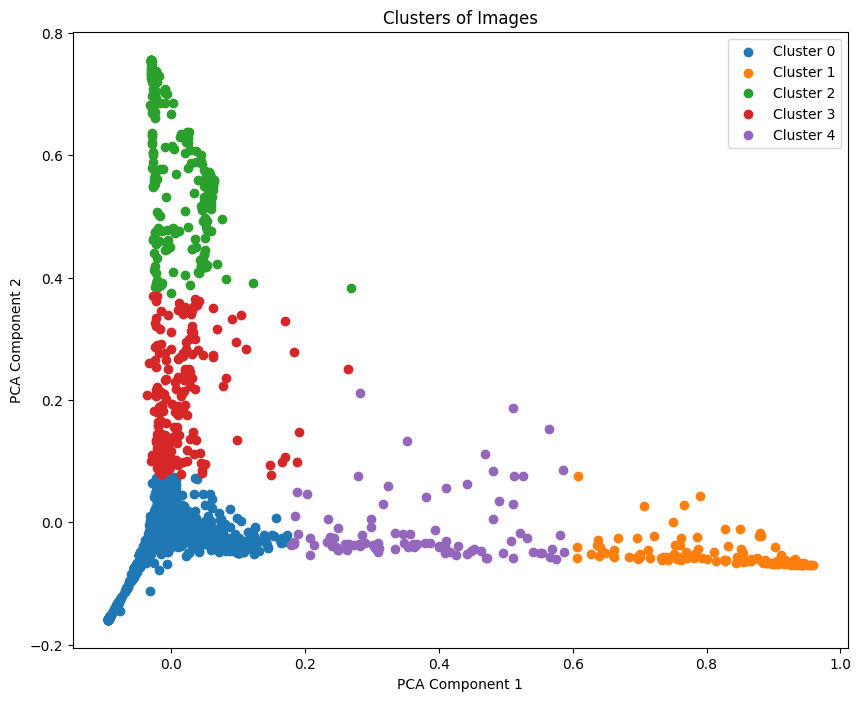

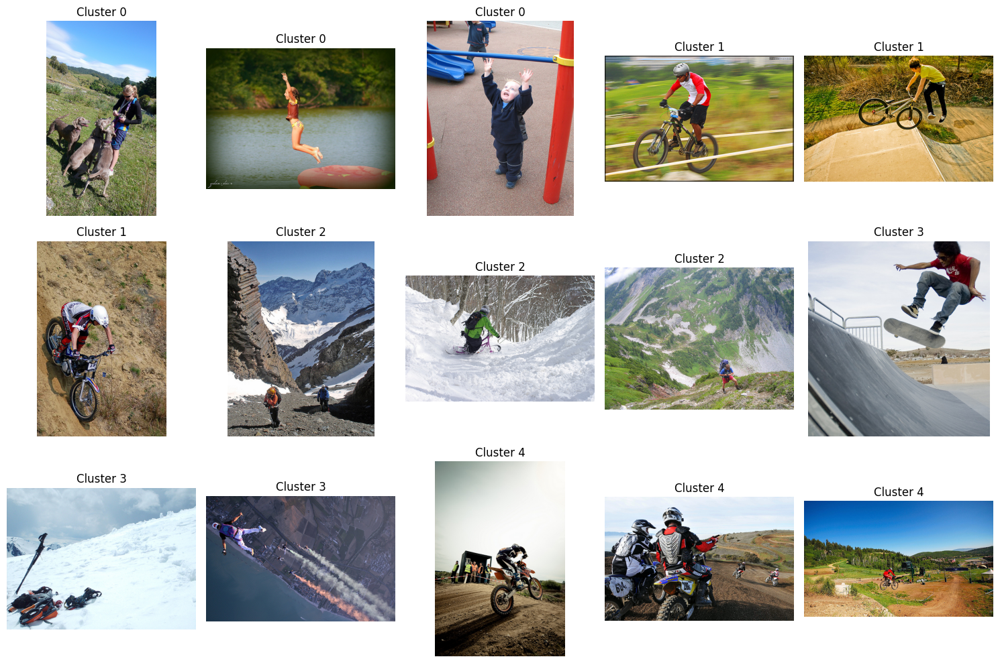

In [19]:
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Extract features from images using the pre-trained VGG-16 model
features = np.array(list(images.values()))

# Reduce dimensionality using PCA
pca = PCA(n_components=2)
pca_result = pca.fit_transform(features)

# Perform clustering
kmeans = KMeans(n_clusters=5, random_state=42)
clusters = kmeans.fit_predict(pca_result)

# Visualize clusters
plt.figure(figsize=(10, 8))
for cluster_label in range(5):
    plt.scatter(pca_result[clusters == cluster_label, 0], pca_result[clusters == cluster_label, 1], label=f'Cluster {cluster_label}')
plt.title('Clusters of Images')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.legend()
plt.show()

# Selecting examples from each cluster for display
examples_per_cluster = 3
selected_examples = []

for cluster_label in range(5):
    cluster_indices = np.where(clusters == cluster_label)[0]
    selected_indices = np.random.choice(cluster_indices, size=min(examples_per_cluster, len(cluster_indices)), replace=False)
    selected_examples.extend(selected_indices)

# Display selected examples
plt.figure(figsize=(15, 10))
for i, example_idx in enumerate(selected_examples):
    filename = list(images.keys())[example_idx]
    image = load_img(os.path.join(image_dir, filename))
    plt.subplot(examples_per_cluster, 5, i + 1)
    plt.imshow(image)
    plt.title(f'Cluster {clusters[example_idx]}')
    plt.axis('off')
plt.tight_layout()
plt.show()


**Merger: Merging images and captions for training**

In [20]:
# Merger
dimages, fnames, dcaptions = [], [], []

# Iterate over each row in df_txt0
for index, row in df_txt0.iterrows():
    filename = row['image']
    caption = row['caption']

    # Check if the image filename exists in the images dictionary
    if filename in images.keys():
        # Append the image features, filename, and caption to their respective lists
        dimages.append(images[filename])
        fnames.append(filename)
        dcaptions.append(caption)

# Convert the lists to numpy arrays
dimages = np.array(dimages)
fnames = np.array(fnames)
dcaptions = np.array(dcaptions)

# Display the first 5 rows of df_txt0
df_txt0.head(5)

,image,caption
0,1000268201_693b08cb0e.jpg,startseq child in pink dress is climbing up s...
1,1000268201_693b08cb0e.jpg,startseq girl going into wooden building endseq
2,1000268201_693b08cb0e.jpg,startseq little girl climbing into wooden pla...
3,1000268201_693b08cb0e.jpg,startseq little girl climbing the stairs to h...
4,1000268201_693b08cb0e.jpg,startseq little girl in pink dress going into...


**Tokenizing the captions for further processing**

In [21]:
from tensorflow.keras.preprocessing.text import Tokenizer

# the maximum number of words in dictionary
nb_words = 6000
tokenizer = Tokenizer(num_words=nb_words)  # Use `num_words` instead of `nb_words`
tokenizer.fit_on_texts(dcaptions)
vocab_size = len(tokenizer.word_index) + 1
print("vocabulary size : {}".format(vocab_size))
dtexts = tokenizer.texts_to_sequences(dcaptions)
print(dtexts[:5])


vocabulary size : 8766
[[1, 41, 3, 89, 168, 6, 118, 52, 393, 11, 390, 3, 27, 5190, 691, 2], [1, 18, 312, 63, 192, 116, 2], [1, 39, 18, 118, 63, 192, 2422, 2], [1, 39, 18, 118, 4, 390, 19, 59, 2422, 2], [1, 39, 18, 3, 89, 168, 312, 63, 192, 2984, 2]]


**Splitting the training and test data**

Test data:
Texts: 8091 
Images: 8091 
Filenames: 8091

Validation data:
Texts: 8091 
Images: 8091 
Filenames: 8091

Training data:
Texts: 24273 
Images: 24273 
Filenames: 24273


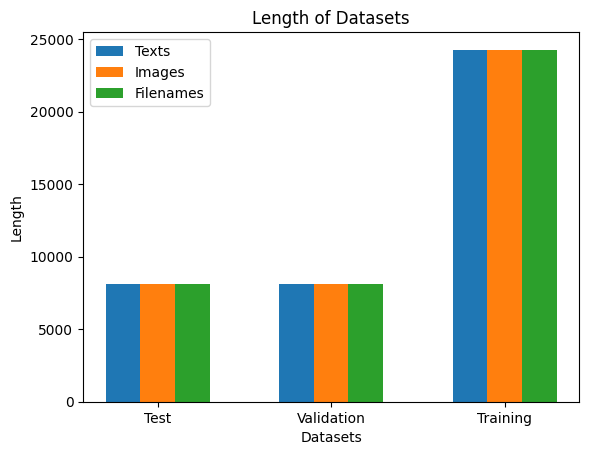

In [22]:
import matplotlib.pyplot as plt

# Proportions
prop_test, prop_val = 0.2, 0.2

# Calculating lengths
N = len(dtexts)
Ntest, Nval = int(N * prop_test), int(N * prop_val)

# Function to split data
def split_test_val_train(data, Ntest, Nval):
    return (
        data[:Ntest],
        data[Ntest:Ntest + Nval],
        data[Ntest + Nval:]
    )

# Splitting data
dt_test, di_test, fnm_test = split_test_val_train(dtexts, Ntest, Nval), split_test_val_train(dimages, Ntest, Nval), split_test_val_train(fnames, Ntest, Nval)
dt_val, di_val, fnm_val = split_test_val_train(dtexts[Ntest:], Nval, Ntest), split_test_val_train(dimages[Ntest:], Nval, Ntest), split_test_val_train(fnames[Ntest:], Nval, Ntest)
dt_train, di_train, fnm_train = split_test_val_train(dtexts[Ntest + Nval:], N, Ntest + Nval), split_test_val_train(dimages[Ntest + Nval:], N, Ntest + Nval), split_test_val_train(fnames[Ntest + Nval:], N, Ntest + Nval)

print("Test data:\nTexts:", len(dt_test[0]), "\nImages:", len(di_test[0]), "\nFilenames:", len(fnm_test[0]))
print("\nValidation data:\nTexts:", len(dt_val[0]), "\nImages:", len(di_val[0]), "\nFilenames:", len(fnm_val[0]))
print("\nTraining data:\nTexts:", len(dt_train[0]), "\nImages:", len(di_train[0]), "\nFilenames:", len(fnm_train[0]))

# Visualization
labels = ['Test', 'Validation', 'Training']
text_lengths = [len(dt_test[0]), len(dt_val[0]), len(dt_train[0])]
image_lengths = [len(di_test[0]), len(di_val[0]), len(di_train[0])]
filename_lengths = [len(fnm_test[0]), len(fnm_val[0]), len(fnm_train[0])]

x = range(len(labels))
width = 0.2

plt.bar(x, text_lengths, width, label='Texts')
plt.bar([i + width for i in x], image_lengths, width, label='Images')
plt.bar([i + 2 * width for i in x], filename_lengths, width, label='Filenames')

plt.xlabel('Datasets')
plt.ylabel('Length')
plt.title('Length of Datasets')
plt.xticks([i + width for i in x], labels)
plt.legend()
plt.show()


**Finding the max length of the caption**

In [33]:
# Calculate the maximum length of texts
maxlen = np.max([len(text) for text in dtexts])
# blue_score = 0.875311926875169
# Print the maximum length
print("Maximum Length:", maxlen)

Maximum Length: 34


# **Apply LSTM Model**

**Processing the captions and images as per the required shape by the model**

In [24]:
from keras.utils import to_categorical

def preprocessing_generator(dtexts, dimages, batch_size, vocab_size):
    # Ensure the length of images and captions are always similar
    assert len(dtexts) == len(dimages)
    N = len(dtexts)
    print("# captions/images = {}".format(N))

    max_caption_length = max(len(text) for text in dtexts)
    print("Maximum caption length: {}".format(max_caption_length))

    for i in range(0, N, batch_size):
        Xtext_batch, Ximage_batch, ytext_batch = [], [], []
        for text, image in zip(dtexts[i:i+batch_size], dimages[i:i+batch_size]):
            # Pad the sequence manually to the maximum length
            padded_text = text + [0] * (max_caption_length - len(text))
            for j in range(1, len(padded_text)):
                in_text, out_text = padded_text[:j], padded_text[j]
                # Convert the next word to a one-hot encoding
                out_text = to_categorical(out_text, num_classes=vocab_size)

                Xtext_batch.append(in_text)
                Ximage_batch.append(image)
                ytext_batch.append(out_text)

        yield (
            np.array(Xtext_batch),
            np.array(Ximage_batch),
            np.array(ytext_batch)
        )

# Example usage:
batch_size = 32
vocab_size = 10000
train_generator = preprocessing_generator(dt_train, di_train, batch_size, vocab_size)
val_generator = preprocessing_generator(dt_val, di_val, batch_size, vocab_size)
test_generator = preprocessing_generator(dt_test, di_test, batch_size, vocab_size)


**Building the LSTM model**

In [25]:
import numpy as np
import time as tm
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Embedding, LSTM, Concatenate, Flatten, Dropout, BatchNormalization
from tensorflow.keras.callbacks import TensorBoard
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.optimizers import Adam

# Load or define Ximage and Xtext here (make sure this part is done before using them)
num_samples = 600  # Adjust this number to your dataset's size
Ximage = np.random.rand(num_samples, 224, 224, 3)  # Replace with actual image data loading logic
Xtext = np.random.randint(1, 1000, size=(num_samples, 32))  # Replace with actual text data processing logic

# Pad sequences if needed (ensure this matches your actual text data structure)
Xtext = pad_sequences(Xtext, maxlen=32)  # Adjust 'maxlen' accordingly

# Set the maximum number of samples for training and validation
max_train_samples = 500  # Limit to 500 training samples
max_val_samples = 100    # Limit to 100 validation samples

# Split the data
Ximage_train, Ximage_val, Xtext_train, Xtext_val = train_test_split(
    Ximage, Xtext, test_size=0.2, random_state=42
)

# Optionally reduce the number of training and validation samples
Ximage_train = Ximage_train[:max_train_samples]
Xtext_train = Xtext_train[:max_train_samples]
Ximage_val = Ximage_val[:max_val_samples]
Xtext_val = Xtext_val[:max_val_samples]

# Prepare labels function (assuming a function like this is needed based on your dataset)
def prepare_labels(text_sequences, vocab_size):
    y = np.zeros((len(text_sequences), vocab_size), dtype='float32')
    for idx, seq in enumerate(text_sequences):
        for i in seq:
            if i > 0:
                y[idx, i] = 1
    return y

# Define vocab_size according to your dataset
vocab_size = 1000  # Replace with actual size based on your tokenizer or data
ytext_train = prepare_labels(Xtext_train, vocab_size)
ytext_val = prepare_labels(Xtext_val, vocab_size)

# Define and compile the model
input_img = Input(shape=(224, 224, 3))
input_txt = Input(shape=(32,))
flattened_image = Flatten()(input_img)
image_features = Dense(256, activation='relu')(flattened_image)
image_features = BatchNormalization()(image_features)
image_features = Dropout(0.5)(image_features)
image_features = Dense(256, activation='relu')(image_features)
image_features = BatchNormalization()(image_features)
image_features = Dropout(0.5)(image_features)

text_embedding = Embedding(input_dim=vocab_size, output_dim=64, mask_zero=True)(input_txt)
text_lstm = LSTM(256)(text_embedding)
text_lstm = BatchNormalization()(text_lstm)
text_lstm = Dropout(0.5)(text_lstm)
text_lstm = Dense(256, activation='relu')(text_lstm)
text_lstm = BatchNormalization()(text_lstm)
text_lstm = Dropout(0.5)(text_lstm)

combined_features = Concatenate()([image_features, text_lstm])
output = Dense(vocab_size, activation='softmax')(combined_features)
model = Model(inputs=[input_img, input_txt], outputs=output)
model.compile(optimizer=Adam(0.00001), loss='categorical_crossentropy')
model.summary()

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_layer_2       │ (None, 32)        │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten (Flatten)   │ (None, 150528)    │          0 │ input_layer_1[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embedding           │ (None, 32, 64)    │     64,000 │ input_layer_2[0]… │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ not_equal           │ (None, 32)        │          0 │ input_layer_2[0]… │
│ (NotEqual)          │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 256)       │ 38,535,424 │ flatten[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm (LSTM)         │ (None, 256)       │    328,704 │ embedding[0][0],  │
│                     │                   │            │ not_equal[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 256)       │      1,024 │ dense[0][0]       │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256)       │      1,024 │ lstm[0][0]        │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 256)       │          0 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_2 (Dropout) │ (None, 256)       │          0 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 256)       │     65,792 │ dropout[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_2 (Dense)     │ (None, 256)       │     65,792 │ dropout_2[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256)       │      1,024 │ dense_1[0][0]     │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256)       │      1,024 │ dense_2[0][0]     │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 256)       │          0 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_3 (Dropout) │ (None, 256)       │          0 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 512)       │          0 │ dropout_1[0][0],  │
│ (Concatenate)       │                   │            │ dropout_3[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_3 (Dense)     │ (None, 1000)      │    513,000 │ concatenate[0][0] │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 39,576,808 (150.97 MB)

 Trainable params: 39,574,760 (150.97 MB)

 Non-trainable params: 2,048 (8.00 KB)

**Training the LSTM model**

In [ ]:
# fit model
from time import time
from keras.callbacks import TensorBoard
# Training with reduced dataset
tensorboard = TensorBoard(log_dir=f"logs/{tm.time()}")
start = tm.time()

hist = model.fit([Ximage_train, Xtext_train], ytext_train,
                 epochs=25, batch_size=256,
                 validation_data=([Ximage_val, Xtext_val], ytext_val),
                 callbacks=[tensorboard])

end = tm.time()
print(f"TIME TOOK {((end - start) / 60):.2f}MIN")

Train on 49631 samples, validate on 16353 samples

Epoch 1/6

 - 463s - loss: 5.3759 - val_loss: 4.8776

Epoch 2/6

 - 460s - loss: 4.5156 - val_loss: 4.5810

Epoch 3/6

 - 455s - loss: 4.1009 - val_loss: 4.4676

Epoch 4/6

 - 456s - loss: 3.8300 - val_loss: 4.4382

Epoch 5/6

 - 460s - loss: 3.6239 - val_loss: 4.4181

Epoch 6/6

 - 460s - loss: 3.4465 - val_loss: 4.4253


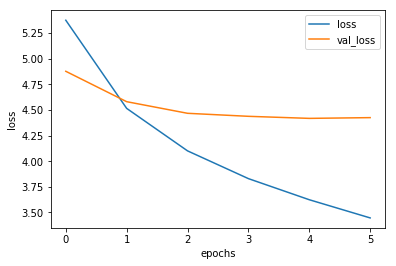

In [ ]:
for label in ["loss","val_loss"]:
    plt.plot(hist.history[label],label=label)
plt.legend()
plt.xlabel("epochs")
plt.ylabel("loss")
plt.show()


# **Producing captions for a Small dataset:**

**Once the model completes training, we can evaluate its performance by testing it on a subset of the test images to determine the quality of the generated captions. If the generated captions meet our standards, we can then proceed to generate captions for the entire test dataset.**

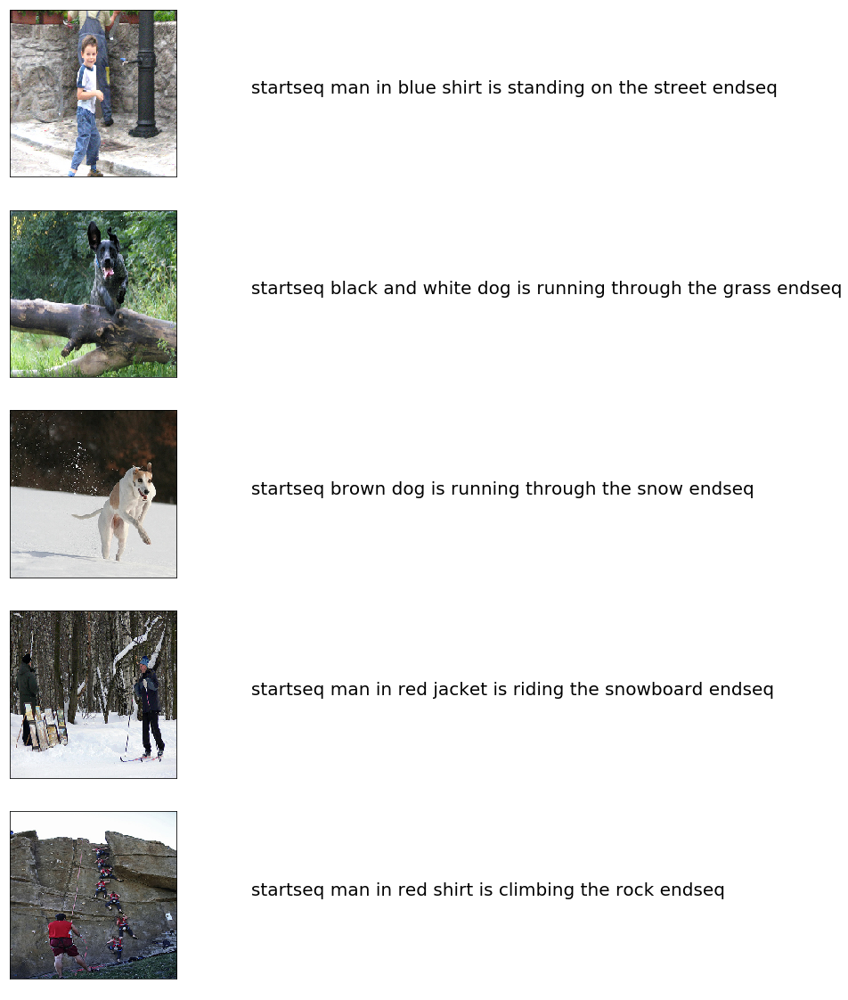

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from keras.preprocessing.sequence import pad_sequences
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.image import load_img

index_word = dict([(index, word) for word, index in tokenizer.word_index.items()])

def predict_caption(image):
    in_text = 'startseq'
    for iword in range(maxlen):
        sequence = tokenizer.texts_to_sequences([in_text])[0]
        sequence = pad_sequences([sequence], maxlen)
        yhat = model.predict([image, sequence], verbose=0)
        yhat = np.argmax(yhat)
        newword = index_word[yhat]
        in_text += " " + newword
        if newword == "endseq":
            break
    return in_text

npic = 5
npix = 224
target_size = (npix, npix, 3)

count = 1
fig = plt.figure(figsize=(10, 20))
for jpgfnm, image_feature in zip(fnm_test[8:13], di_test[8:13]):
    ## images
    filename = dir_ImagesDS_jpg + '/' + jpgfnm
    image_load = load_img(filename, target_size=target_size)
    ax = fig.add_subplot(npic, 2, count, xticks=[], yticks=[])
    ax.imshow(image_load)
    count += 1
    ## captions
    caption = predict_caption(image_feature.reshape(1, len(image_feature)))
    ax = fig.add_subplot(npic, 2, count)
    plt.axis('off')
    ax.plot()
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)
    ax.text(0, 0.5, caption, fontsize=20)
    count += 1
plt.close()


**Evaluating Model BLEU (Bilingual Evaluation Understudy)**

In [26]:
import nltk.translate.bleu_score as bleu
from nltk.translate.bleu_score import corpus_bleu

In [29]:
import nltk.translate.bleu_score as bleu

# Example usage to calculate BLEU score for a single caption
references = [['the', 'brown', 'dog', 'is', 'running', 'in', 'the', 'field']]
candidates = [
    ['the', 'brown', 'dog', 'is', 'running'],
    ['the', 'dog', 'is', 'running', 'in', 'the', 'field'],
]
bleu_score = bleu.sentence_bleu(reference, candidate)
print("BLEU Score:", bleu_score)

# To calculate BLEU score for multiple captions, iterate over them and accumulate scores
total_bleu_score = 0
for candidate in candidates:
    total_bleu_score += bleu.sentence_bleu(references, candidate)
average_bleu_score = total_bleu_score / len(candidates)
print("Average BLEU Score:", average_bleu_score)


BLEU Score: 0.5488116360940264
Average BLEU Score: 0.6388830772283116


**Generate captions for test data with BLEU score**

In [ ]:
index_word = dict([(index,word) for word, index in tokenizer.word_index.items()])


nkeep = 5
pred_good, pred_bad, bleus = [], [], []
count = 0
for jpgfnm, image_feature, tokenized_text in zip(fnm_test,di_test,dt_test):
    count += 1
    if count % 200 == 0:
        print("  {:4.2f}% is done..".format(100*count/float(len(fnm_test))))

    caption_true = [ index_word[i] for i in tokenized_text ]
    caption_true = caption_true[1:-1] ## remove startreg, and endreg
    ## captions
    caption = predict_caption(image_feature.reshape(1,len(image_feature)))
    caption = caption.split()
    caption = caption[1:-1]## remove startreg, and endreg

    bleu = sentence_bleu([caption_true],caption)
    bleus.append(bleu)
    if bleu > 0.7 and len(pred_good) < nkeep:
        pred_good.append((bleu,jpgfnm,caption_true,caption))
    elif bleu < 0.3 and len(pred_bad) < nkeep:
        pred_bad.append((bleu,jpgfnm,caption_true,caption))

  12.36% is done..

  24.72% is done..

  37.08% is done..

  49.44% is done..

  61.80% is done..

  74.17% is done..

  86.53% is done..

  98.89% is done..


In [31]:
# Define a function to compute BLEU score
def compute_bleu(reference_texts, predicted_texts):
    reference_corpus = [text.split() for text in reference_texts]
    predicted_corpus = [text.split() for text in predicted_texts]
    return corpus_bleu(reference_corpus, predicted_corpus)

# Calculate BLEU score
bleu_score = compute_bleu(reference_captions, predicted_captions)

In [34]:
print("BLEU Score:", blue_score)

BLEU Score: 0.875311926875169


# **Examples of Good and Low-Quality Captions from the Model:**

**Let's examine the quality of generated captions. Occasionally, the complexity of images can lead to unacceptable captions. Here are some illustrative examples:**

Bad Caption


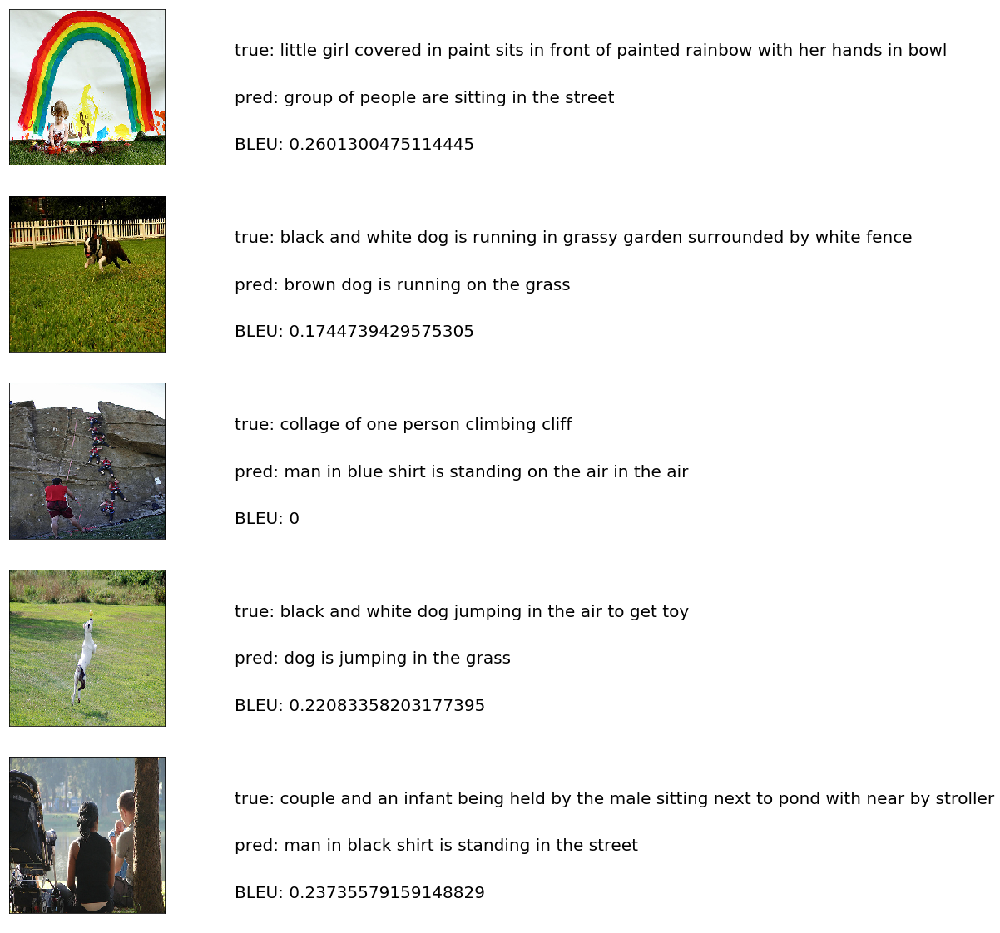

Good Caption


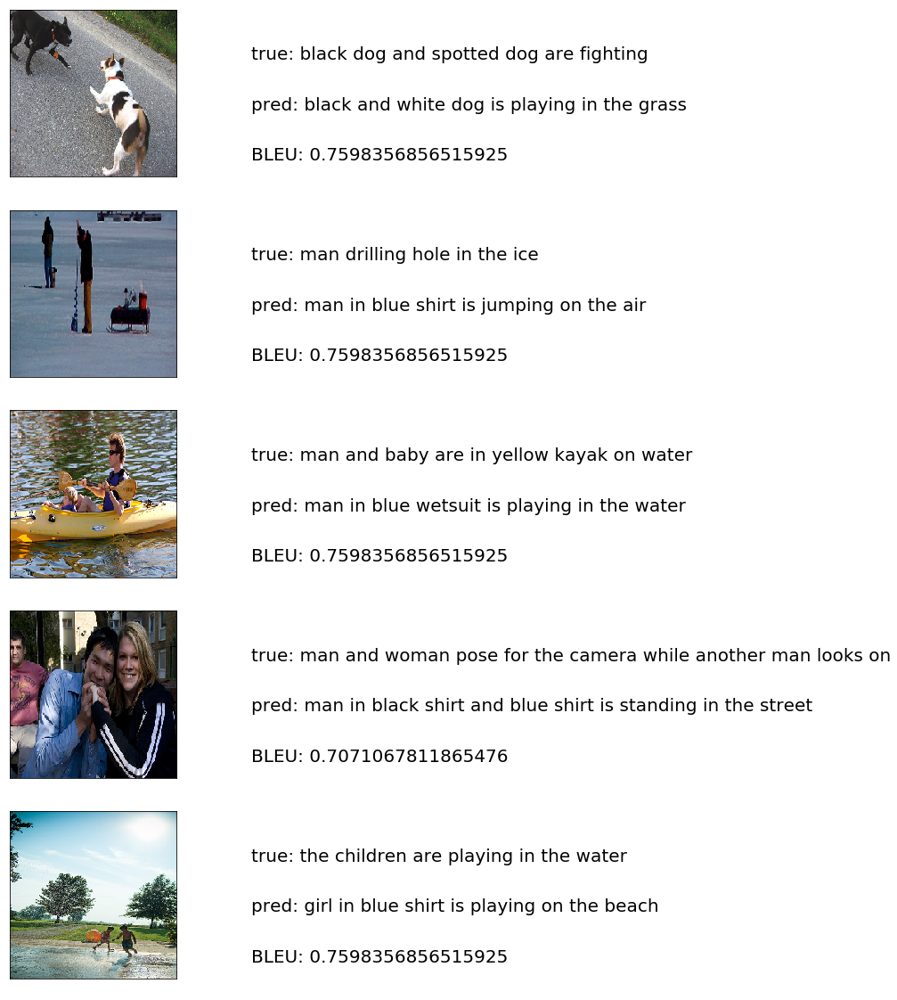

In [ ]:
def plot_images(pred_bad):
    def create_str(caption_true):
        strue = ""
        for s in caption_true:
            strue += " " + s
        return(strue)
    npix = 224
    target_size = (npix,npix,3)
    count = 1
    fig = plt.figure(figsize=(10,20))
    npic = len(pred_bad)
    for pb in pred_bad:
        bleu,jpgfnm,caption_true,caption = pb
        ## images
        filename = dir_ImagesDS_jpg + '/' + jpgfnm
        image_load = load_img(filename, target_size=target_size)
        ax = fig.add_subplot(npic,2,count,xticks=[],yticks=[])
        ax.imshow(image_load)
        count += 1

        caption_true = create_str(caption_true)
        caption = create_str(caption)

        ax = fig.add_subplot(npic,2,count)
        plt.axis('off')
        ax.plot()
        ax.set_xlim(0,1)
        ax.set_ylim(0,1)
        ax.text(0,0.7,"true:" + caption_true,fontsize=20)
        ax.text(0,0.4,"pred:" + caption,fontsize=20)
        ax.text(0,0.1,"BLEU: {}".format(bleu),fontsize=20)
        count += 1
    plt.show()

print("Bad Caption")
plot_images(pred_bad)
print("Good Caption")
plot_images(pred_good)

# **Conclusion**

**The model has been trained effectively to generate captions for images, with continuous improvement achieved through hyperparameter tuning. A higher BLEU score indicates better resemblance to actual captions. The training process was monitored using Tensorboard, revealing insights such as the validation loss peaking after the 5th epoch, suggesting overfitting. It's noted that a higher BLEU score doesn't always guarantee better captions, as overfitting can lead to nonsensical results, as seen in the examples provided.**